In [1]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from rasterio.merge import merge
import glob

from rasterio.plot import adjust_band
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image
import rasterio.features
import rasterio.warp
import rasterio.mask
from rasterio.merge import merge
import tensorflow as tf
#from tensorflow import keras
#from tensorflow.keras.models import load_model

from skimage.transform import resize
from matplotlib import cm

from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.scorecam import Scorecam
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

from tf_keras_vis.activation_maximization.input_modifiers import Jitter, Rotate2D, Scale
from tf_keras_vis.activation_maximization.regularizers import Norm, TotalVariation2D
from tf_keras_vis.activation_maximization.callbacks import Progress, PrintLogger

from tensorflow.keras.preprocessing.image import load_img
from tf_keras_vis.activation_maximization import ActivationMaximization

In [2]:

def predictingNewX(model,data_dir_list,data_path,width,height,layers,fulldataset_df):
    #load list of image names in each category
    img_list = os.listdir(os.path.join(data_path))
     #   print ('Loading the images for prediction -'+'{}\n'.format(dataset))
    num_img_files = len(img_list) 
    for i in range(num_img_files):
        X_new = []
        img_name = img_list[i]
        img_filename = os.path.join(data_path,img_name)
        #model expects image formatted a certain way
        with rasterio.open(img_filename) as ds:
            tile=ds.read()
            #plt.imshow(tile.read(1), cmap='pink')
            #plt.show()
            #preprocess tille according to model expectations
            pre_tile=newXpreprocessing(tile,layers,width,height)
        
        # Add tile to array
        X_new.append(pre_tile)
        X_new = np.array(X_new)
        rgbpath = 'C:\Data\Drone_RGB'
        #image = load_img(os.path.join(rgbpath,img_name),target_size=(32, 32))
        image = load_img(os.path.join(rgbpath,img_name),target_size=(width, height))
        #resize image in case patch is too big
        image = image.resize((83,83))
        #print(os.path.join(rgbpath,img_name))
        yNew = model.predict(X_new)
        #Transposed value to get easy access to prediction for 1 (prospectable)
        yNewT = yNew.T
        #fulldataset_df = fulldataset_df.append({'FileName':img_filename,'donga':"{:.8f}".format(yNewT[0,0]),'dried_mudflat':"{:.8f}".format(yNewT[1,0]),'grass_vegetation':"{:.8f}".format(yNewT[2,0]),'sandstone':"{:.8f}".format(yNewT[3,0]),'shrub_vegetation':"{:.8f}".format(yNewT[4,0]) },ignore_index=True)
        fulldataset_df = fulldataset_df.append({'FileName':img_filename,'noprospect':"{:.8f}".format(yNewT[0,0]),'prospect':"{:.8f}".format(yNewT[1,0])},ignore_index=True)
        plot_vanilla_saliency_of_a_model(model, X_new, img_name)
        plot_smoothgrad_of_a_model(model, X_new, img_name)
        plot_gradcam_of_a_model(model, X_new, img_name, image)
        plot_scorecam_of_a_model(model, X_new, img_name, image)
        #plot_dense_layer_visualisation(model,X_new, img_name)
    return fulldataset_df


In [3]:
#ensure size of tile is uniform, and reshape the numpy into a image format then normalize
def newXpreprocessing(tile,layers,width,height):
    #print(tile.shape,"before")
    tile = resize(tile, (layers,width,height))
    #print(tile.shape,"resize")
    tile = reshape_as_image(tile)
    #print(tile.shape,"reshape")
    #normalising tile
    tile = tile/255
    return tile

In [4]:
#https://insights.willogy.io/tensorflow-insights-part-3-visualizations/
def plot_vanilla_saliency_of_a_model(model, X, image_title):
    # This is different from subsection a)
    # Here, we don't give the filter index to CategoricalScore
    # but the index corresponding to "Chihuahua", "Japanese spaniel" and "Maltese dog"
    # Because there are only 3 classes, we use `list(range())` method
    # to generate list [0, 1, 2]
    score = CategoricalScore(list(range(X.shape[0])))
    image_title = image_title[:-4]
    # Create Saliency visualization object
    saliency = Saliency(model,
                        model_modifier=ReplaceToLinear(), # replaces the activation function of the chosen layer (here is the last layer) to linear function (for visualization)
                        clone=True)

    # Generate saliency map
    saliency_map = saliency(score, X)
    # Plot
    plt.suptitle('vanilla_' + image_title, fontsize=16)
    plt.imshow(saliency_map[0], cmap='jet')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('vanilla_saliency_' + image_title + '.png')
    plt.show()

In [5]:
def plot_smoothgrad_of_a_model(model, X, image_title):
    score = CategoricalScore(list(range(X.shape[0])))

    # Create Saliency visualization object
    saliency = Saliency(model,
                        model_modifier=ReplaceToLinear(),
                        clone=True)
    image_title = image_title[:-4]
    # Generate saliency map
    saliency_map = saliency(score, X,
                            smooth_samples=20, # The number of calculating gradients iterations
                            smooth_noise=0.20) # noise spread level

    # Plot
    plt.suptitle('smoothgrad_' + image_title, fontsize=16)
    plt.imshow(saliency_map[0], cmap='jet')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('smooth_saliency_' + image_title + '.png')
    plt.show()

In [6]:
def plot_gradcam_of_a_model(model, X, image_title, image):
    score = CategoricalScore(list(range(X.shape[0])))

    # Create Gradcam visualization object
    gradcam = Gradcam(model,
                     model_modifier=ReplaceToLinear(),
                     clone=True)
    
    
    image_title = image_title[:-4]
    # Generate heatmap by GradCAM
    cam = gradcam(score,
                  X,
                  penultimate_layer=-1)
    #image = image[4:,:,:]
    #image = reshape_as_image(image)
    # Plot
    #results are in (1,32,32,3) - remove extra dimension
    cam = cam[0,:]
    print(len(cam))
    heatmap = np.uint8(cm.jet(cam)[..., :3] * 255)
    #print(heatmap)
    plt.suptitle('gradcam_' + image_title, fontsize=16)
    #plt.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    plt.imshow(image)
    plt.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('gradcam_' + image_title + '.png')
    plt.show()

In [7]:
def plot_scorecam_of_a_model(model, X, image_title, image):
    score = CategoricalScore(list(range(X.shape[0])))

    # Create ScoreCAM object
    scorecam = Scorecam(model, model_modifier=ReplaceToLinear())
    
    
    image_title = image_title[:-4]
    # Generate heatmap by GradCAM
    cam = scorecam(score,
                  X,
                  penultimate_layer=-1)
                    #,max_N=10)
    #image = image[4:,:,:]
    #image = reshape_as_image(image)
    # Plot
    #results are in (1,32,32,3) - remove extra dimension
    cam = cam[0,:]
    print(len(cam))
    heatmap = np.uint8(cm.jet(cam)[..., :3] * 255)
    #print(heatmap)
    plt.suptitle('scorecam_' + image_title, fontsize=16)
    plt.imshow(image)
    plt.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    #plt.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('scorecam_' + image_title + '.png')
    plt.show()

In [8]:
#https://insights.willogy.io/tensorflow-insights-part-3-visualizations/
def plot_dense_layer_visualisation(model,X, image_title):
    # This is different from subsection a)
    # Here, we don't give the filter index to CategoricalScore
    # but the index corresponding to "Chihuahua", "Japanese spaniel" and "Maltese dog"
    # Because there are only 3 classes, we use `list(range())` method
    # to generate list [0, 1, 2]
    score = CategoricalScore(list(range(X.shape[0])))
    image_title = image_title[:-4]
    
    seed_input = tf.random.uniform((1, 83, 83, 7), 0, 255)
    
    activation_maximization = ActivationMaximization(model,
                                                 model_modifier=ReplaceToLinear(),
                                                 clone=True)
    activations = activation_maximization(score,
                                          seed_input=seed_input,
                                          callbacks=[Progress()])

    # Plot
    plt.suptitle('visual_' + image_title, fontsize=16)
    plt.imshow(activations[4:,:,:])
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('visual_' + image_title + '.png')
    plt.show()

In [9]:
def plot_confusion_matrix(y_true, y_pred, classes, class_dict,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues,model_name='test'):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    # convert class_id to class_name using the class_dict
    cover_names = []
    for cover_class in classes:
        cover_names.append(class_dict[cover_class])
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    else:
        pass
    #print(cm)

    fig, ax = plt.subplots(figsize=(10,10))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=cover_names, yticklabels=cover_names,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    #save a copy of the classification matrix
    fig.savefig('classification_matrix_' + model_name + '.png')
    return ax

def save_metrics(test_datagen,test_df,model_name,model,width,height,layers,class_count,test_count,batch):
    #predictions against test dataset
    predictions = model.predict_generator(generator=test_datagen, 
                            steps= test_count // batch,
                             verbose=1)

    eval_generator = generator(samples=test_df,batch_size=1,width=width,height=height,layers=layers,class_count=class_count)
    #determining labels
    labels = np.empty(predictions.shape)
    count = 0
    while count < len(labels):
        image_b, label_b = next(eval_generator)
        labels[count] = label_b
        count += 1

    label_index = np.argmax(labels, axis=1)     
    pred_index = np.argmax(predictions, axis=1)
    #calcualte metrics
    accuracy = accuracy_score(label_index, pred_index)
    precision = precision_score(label_index, pred_index,average='macro')
    recall = recall_score(label_index, pred_index, average='macro')
    f1 = f1_score(label_index, pred_index,average='macro')
    kappa = cohen_kappa_score(label_index, pred_index)
  
    print('Accuracy: %f' % accuracy)
    print('Precision: %f' % precision)
    print('Recall: %f' % recall)
    print('F1 score: %f' % f1)
    print('Cohens kappa: %f' % kappa)

    # Plot non-normalized confusion matrix
    plot_confusion_matrix(label_index, pred_index, classes=np.array(list(class_names)),
                              class_dict=class_names,model_name=model_name)
    
    return gridsearch_df

In [10]:
#declare path directories
data_path = r'C:\Data\Saliency2'
data_dir_list = os.listdir(data_path)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 83, 83, 64)        4096      
                                                                 
 batch_normalization (BatchN  (None, 83, 83, 64)       256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 83, 83, 64)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 41, 41, 64)       0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 107584)            0         
                                                                 
 dense (Dense)               (None, 256)               2

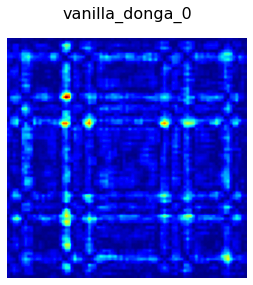

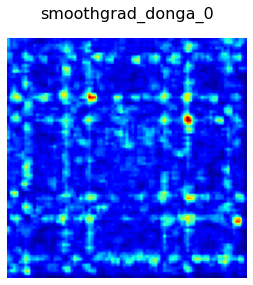

83


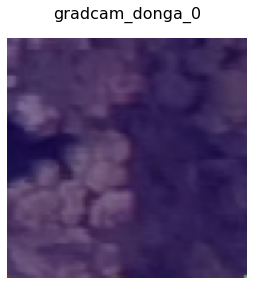

83


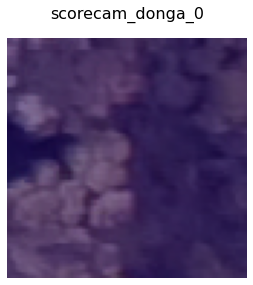

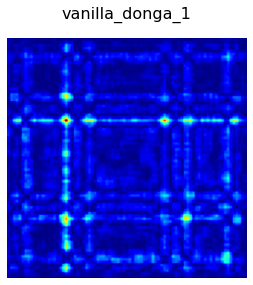

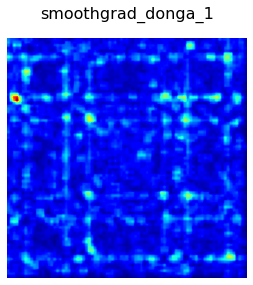

83


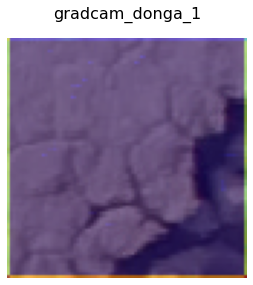

83


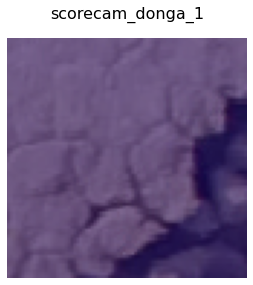

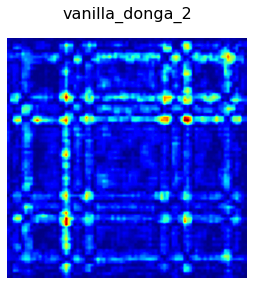

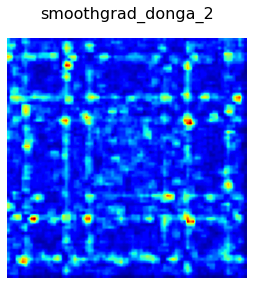

83


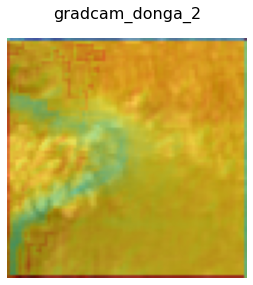

83


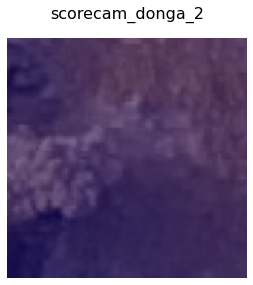

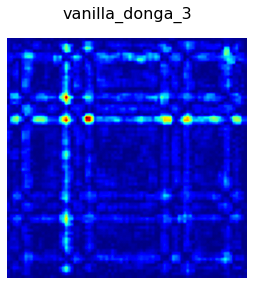

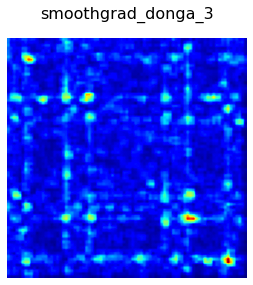

83


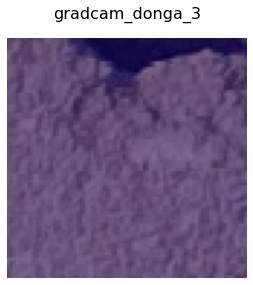

83


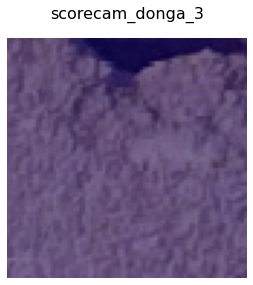

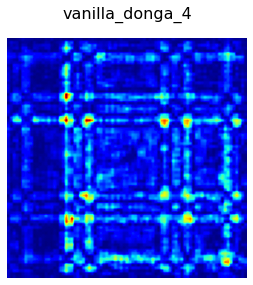

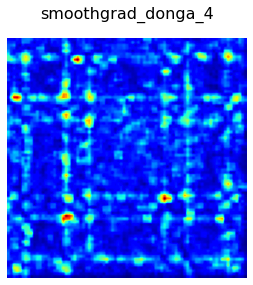

83


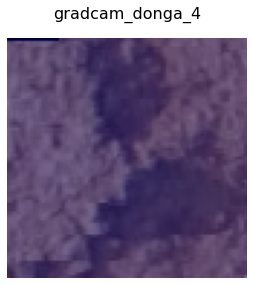

83


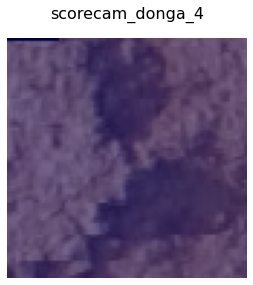

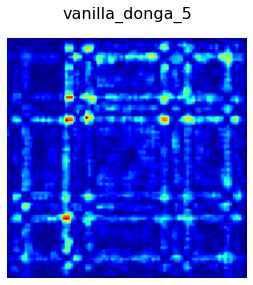

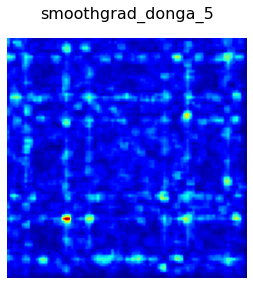

83


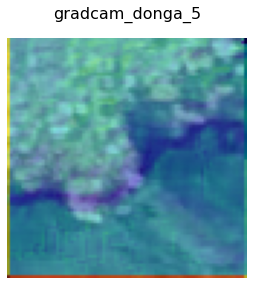

83


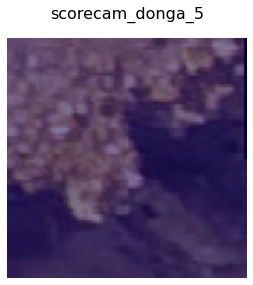

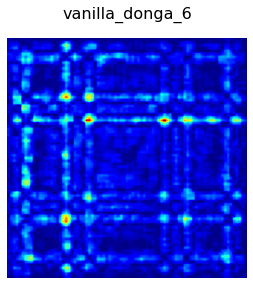

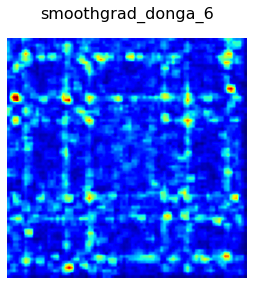

83


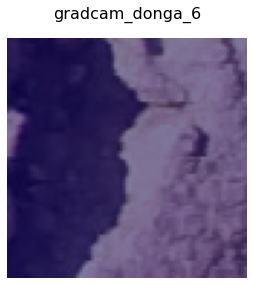

83


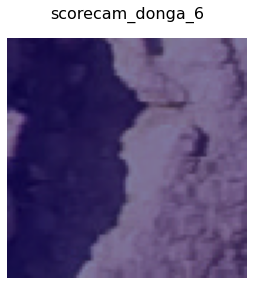

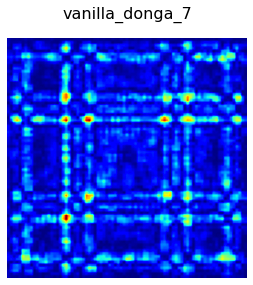

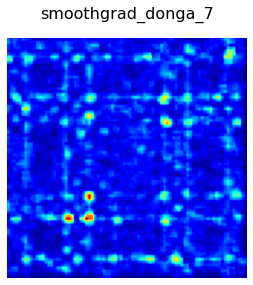

83


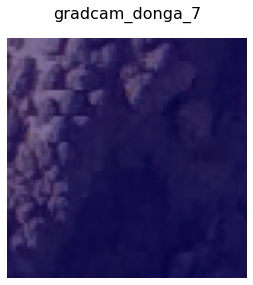

83


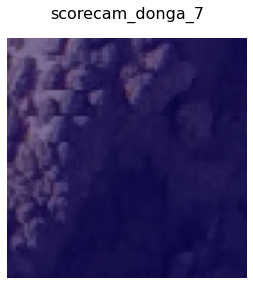

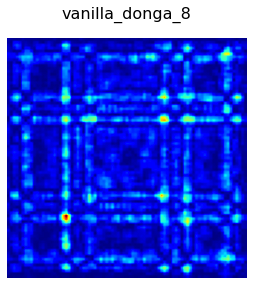

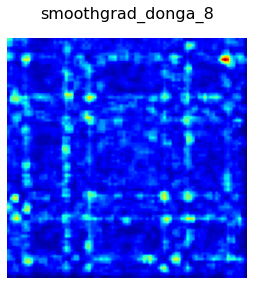

83


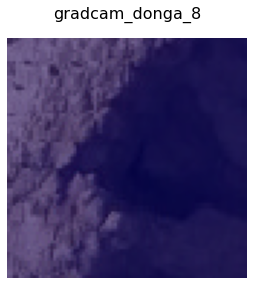

83


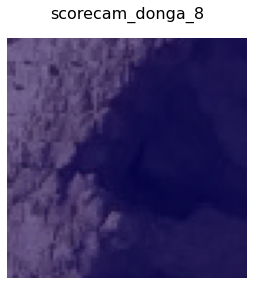

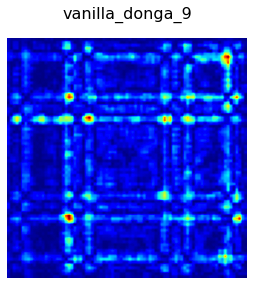

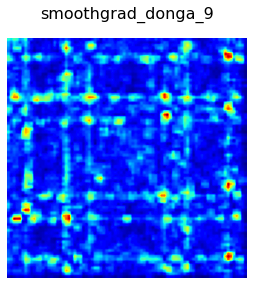

83


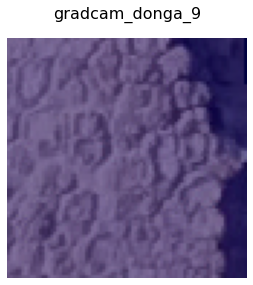

83


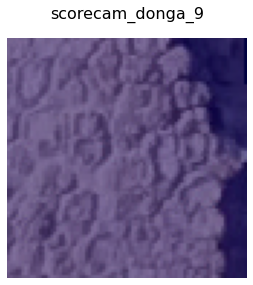

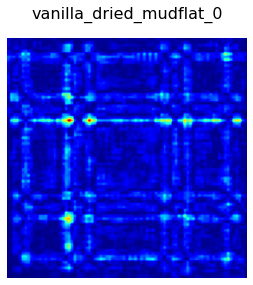

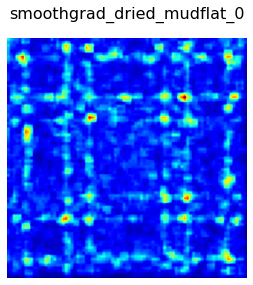

83


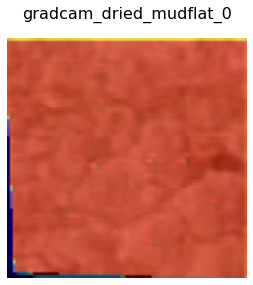

83


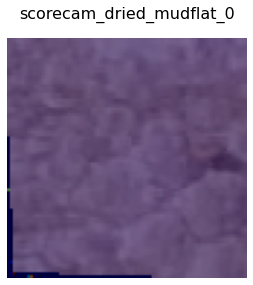

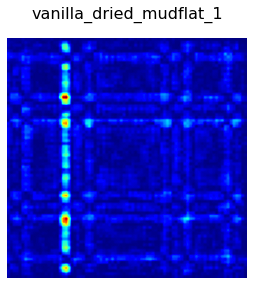

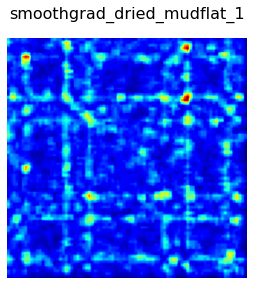

83


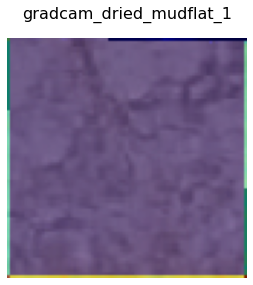

83


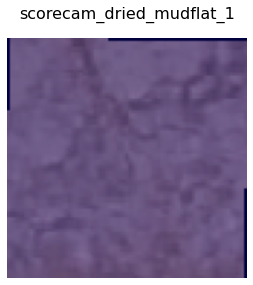

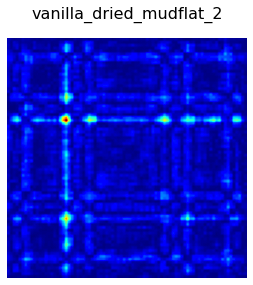

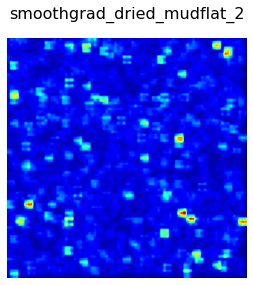

83


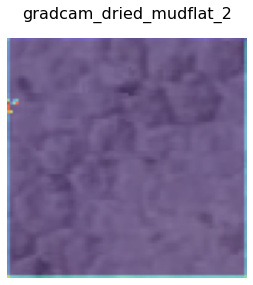

83


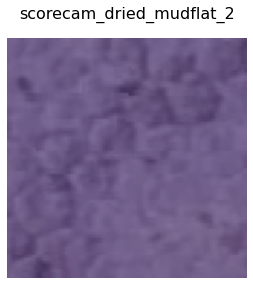

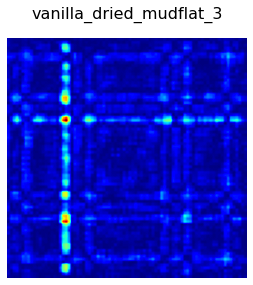

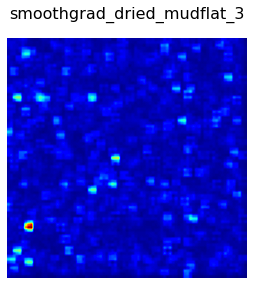

83


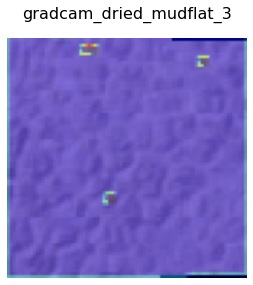

83


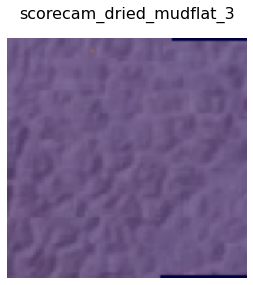

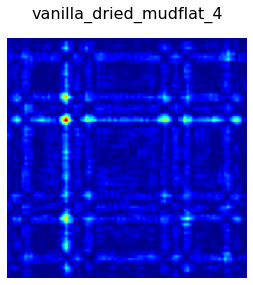

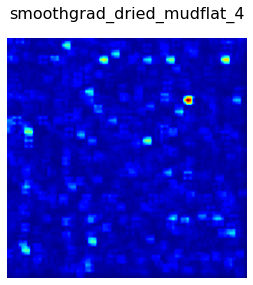

83


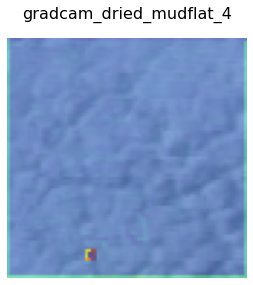

83


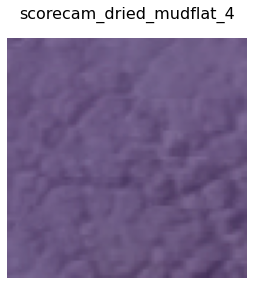

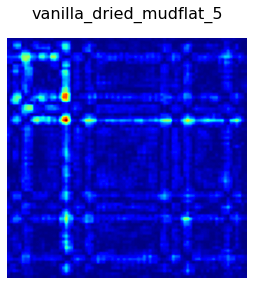

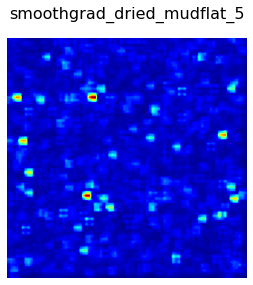

83


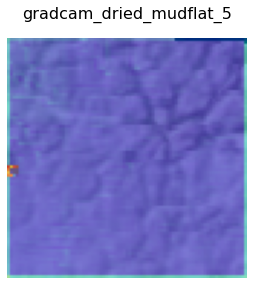

83


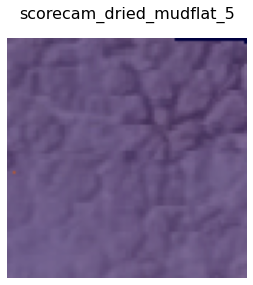

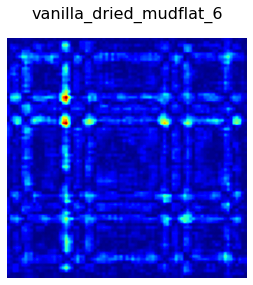

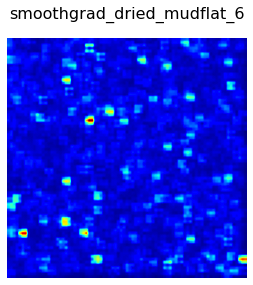

83


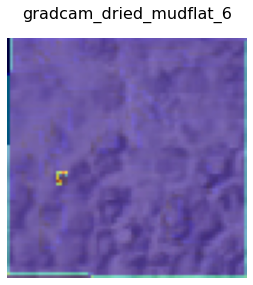

83


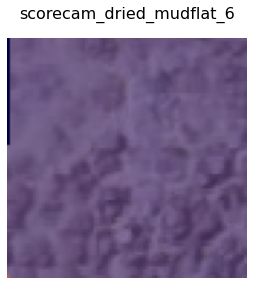

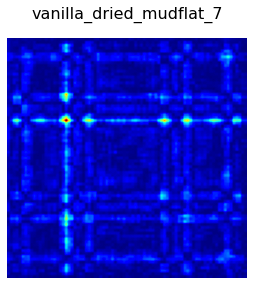

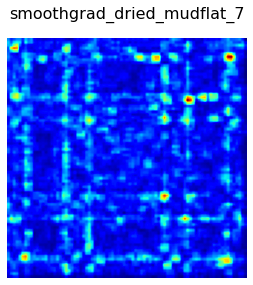

83


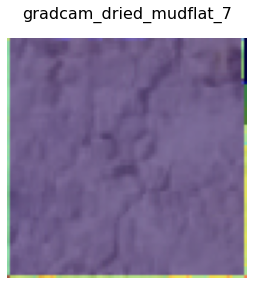

83


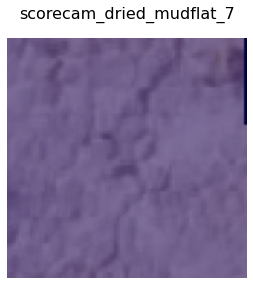

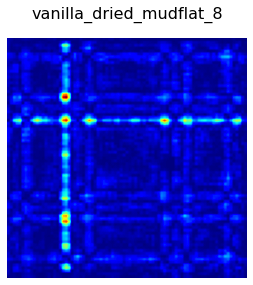

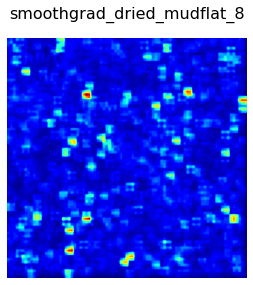

83


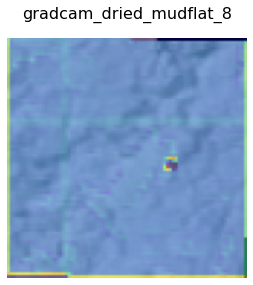

83


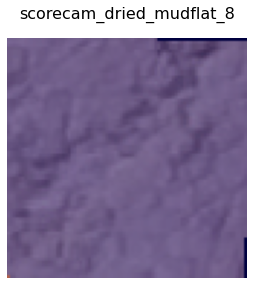

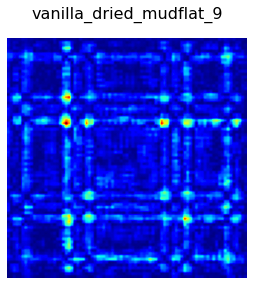

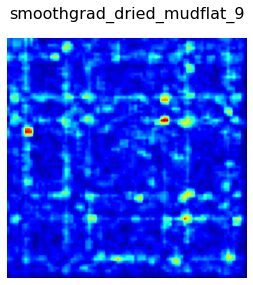

83


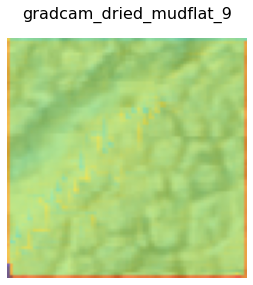

83


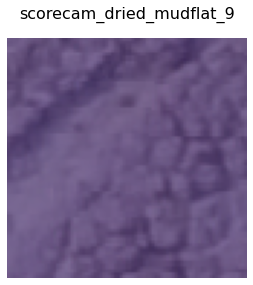

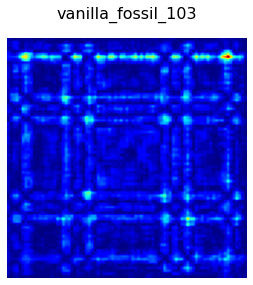

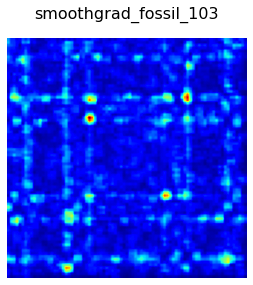

83


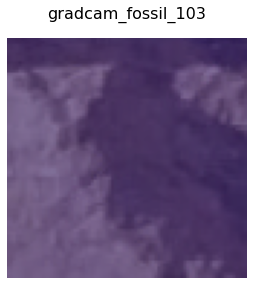

83


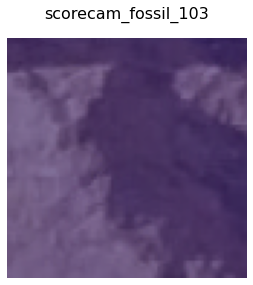

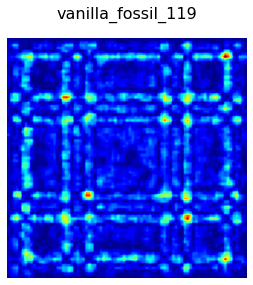

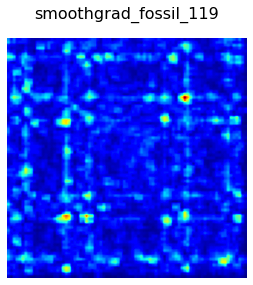

83


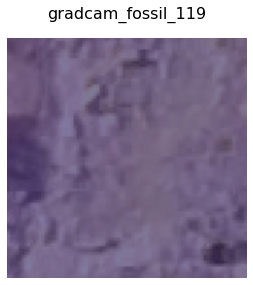

83


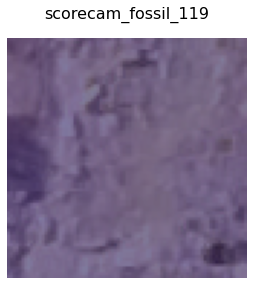

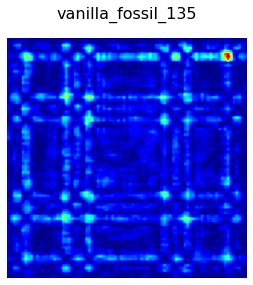

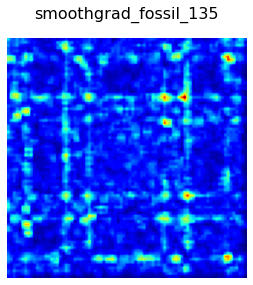

83


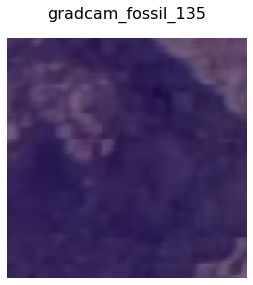

83


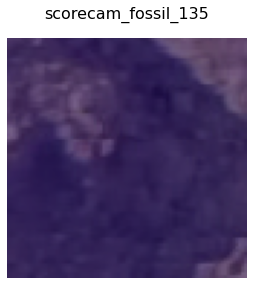

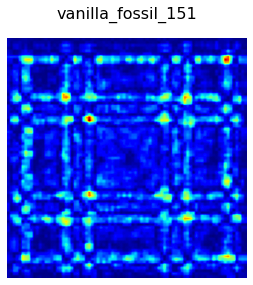

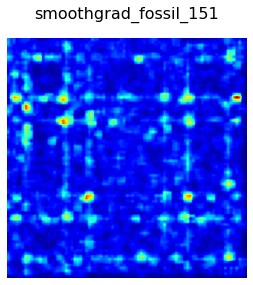

83


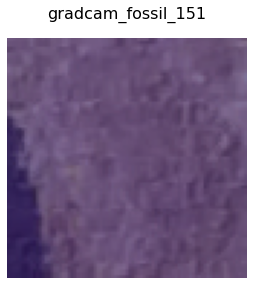

83


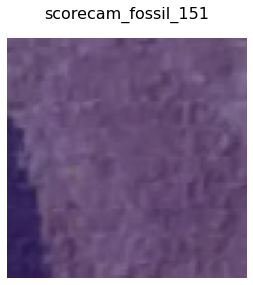

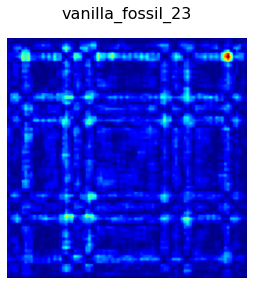

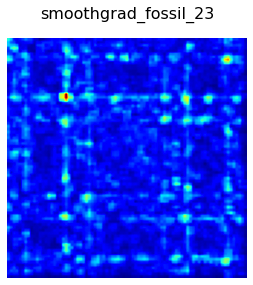

83


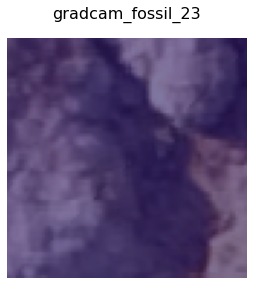

83


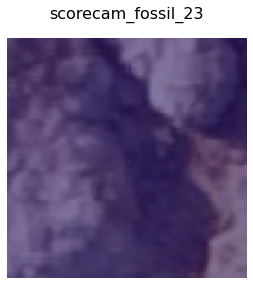

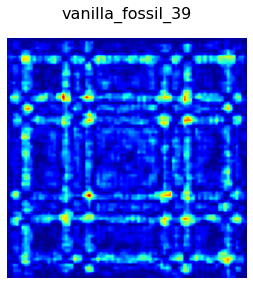

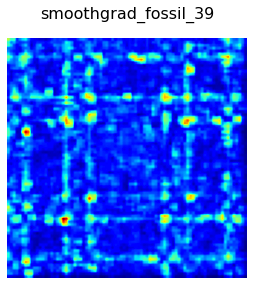

83


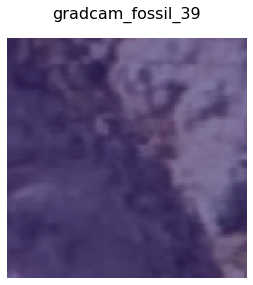

83


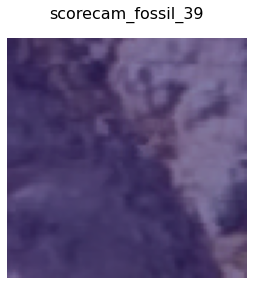

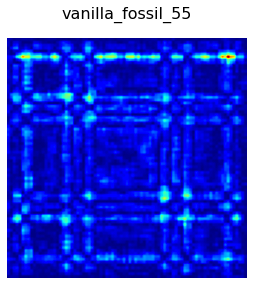

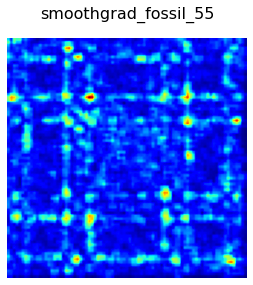

83


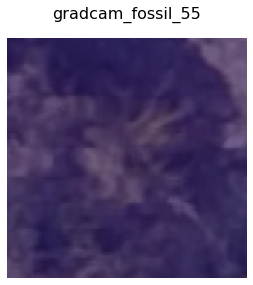

83


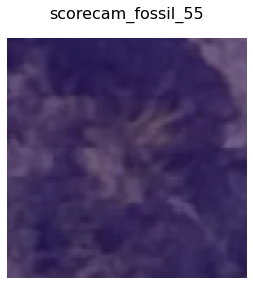

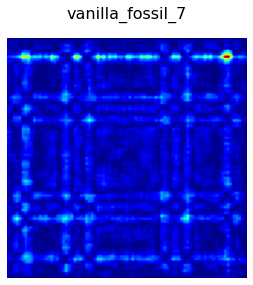

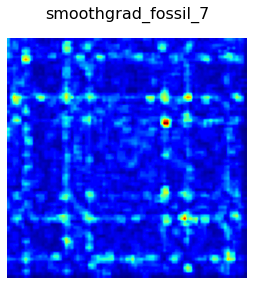

83


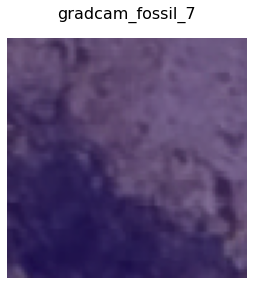

83


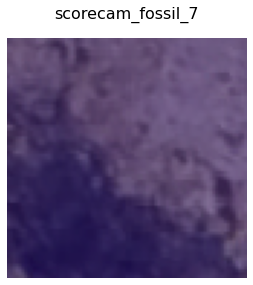

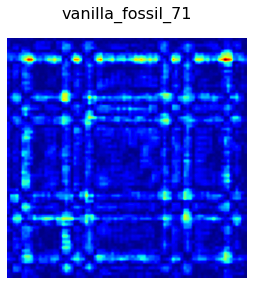

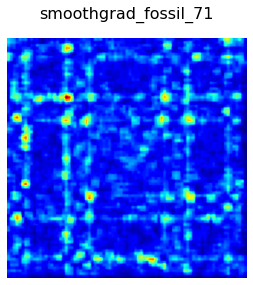

83


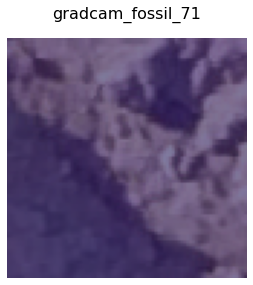

83


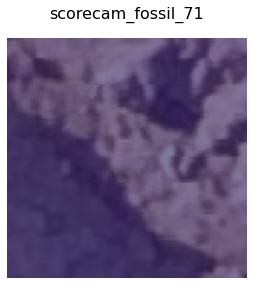

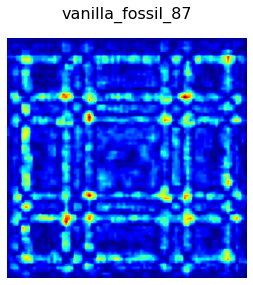

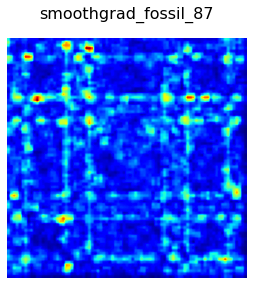

83


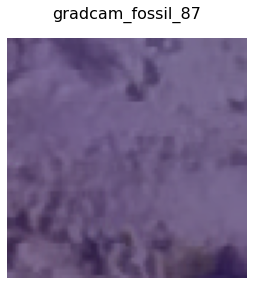

83


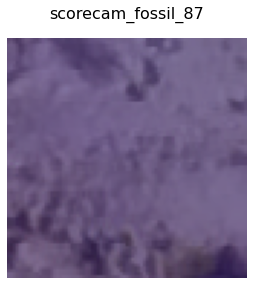

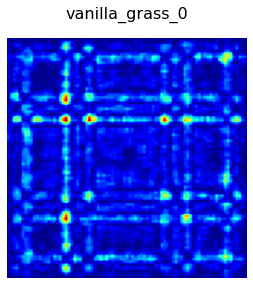

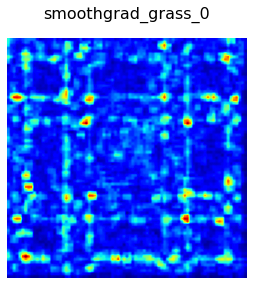

83


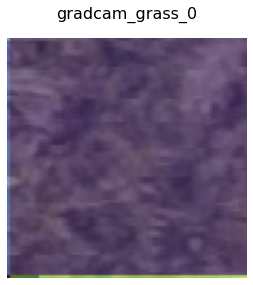

83


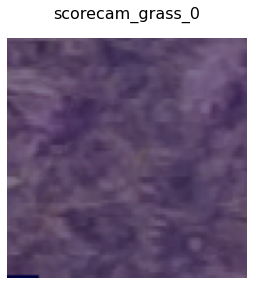

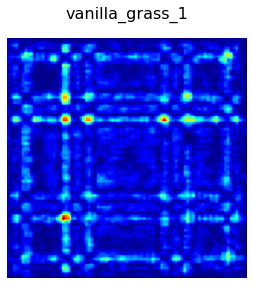

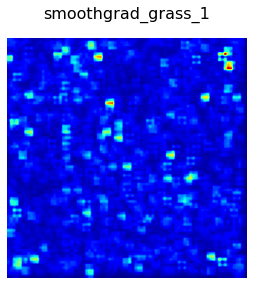

83


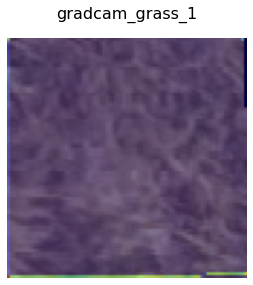

83


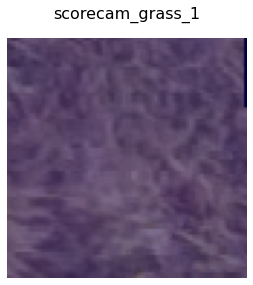

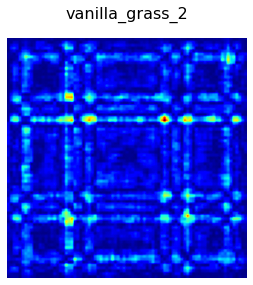

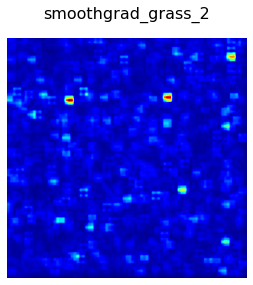

83


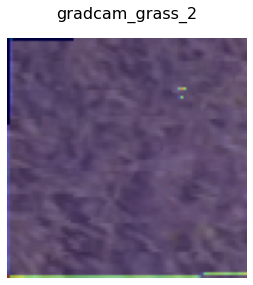

83


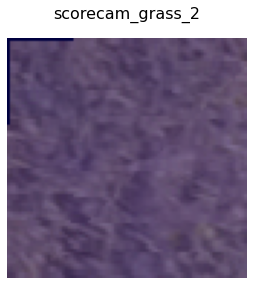

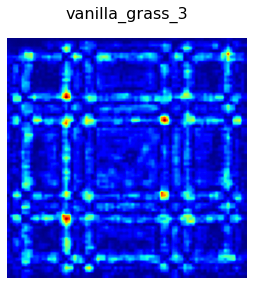

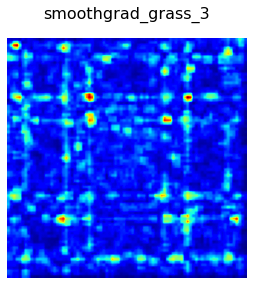

83


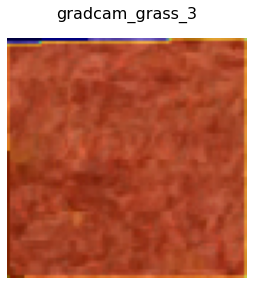

83


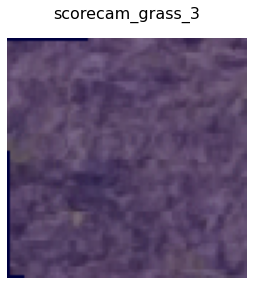

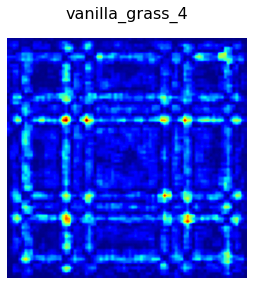

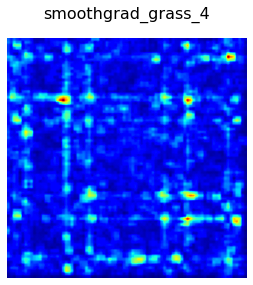

83


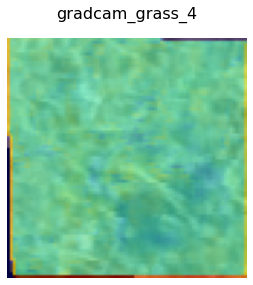

83


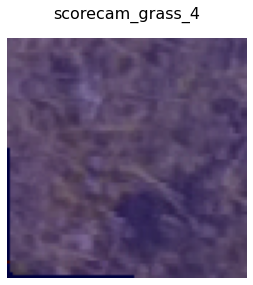

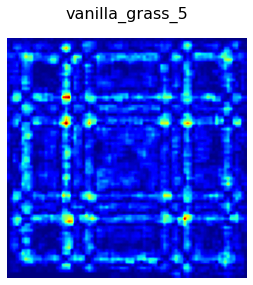

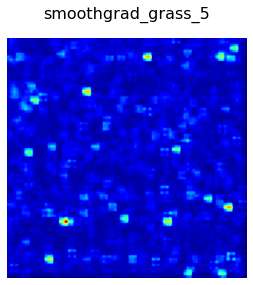

83


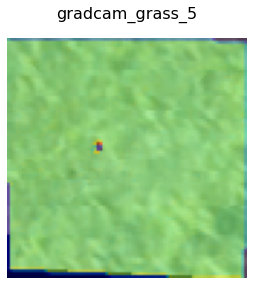

83


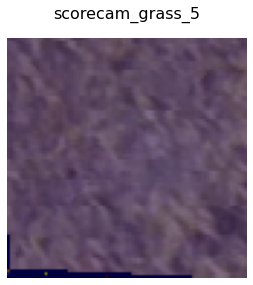

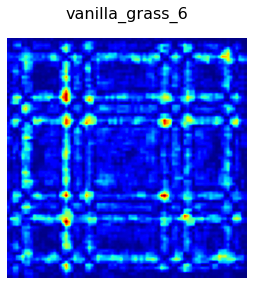

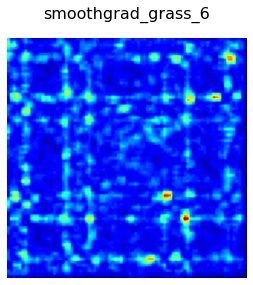

83


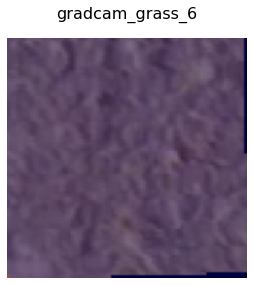

83


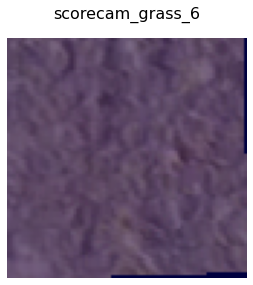

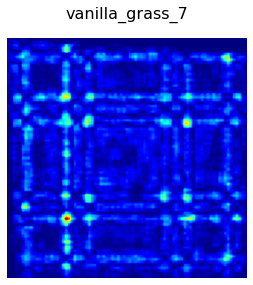

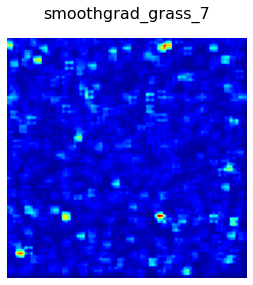

83


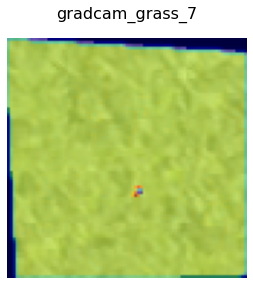

83


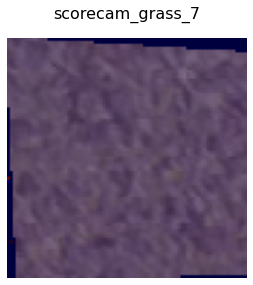

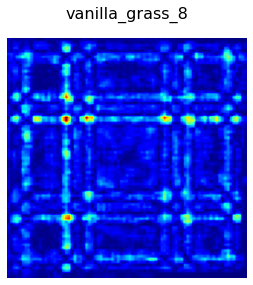

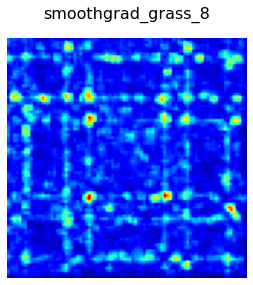

83


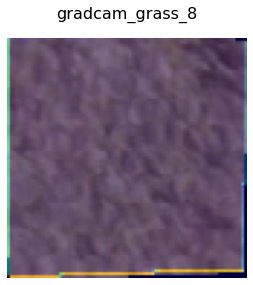

83


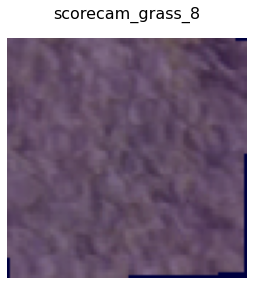

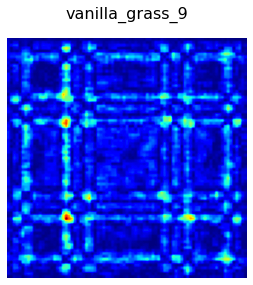

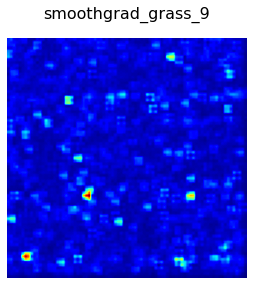

83


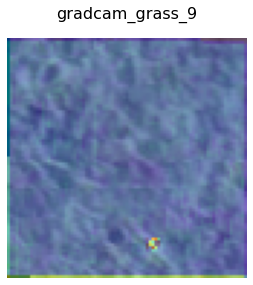

83


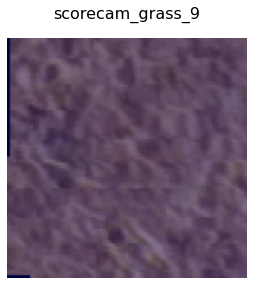

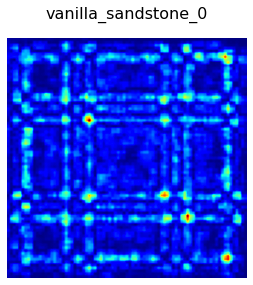

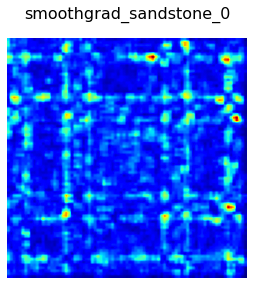

83


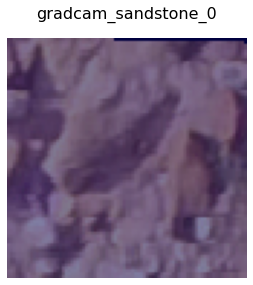

In [ ]:
#declare all needed dataframes
#class_names = dict((
#(0,  'donga'),
#(1, 'dried_mudflat'),
#(2, 'grass_vegetation'),
#(3, 'sandstone'),
#(4, 'shrub_vegetation'),
#))
#fulldataset_df = pd.DataFrame(columns=['FileName','donga','dried_mudflat','grass_vegetation','sandstone','shrub_vegetation']) 
fulldataset_df = pd.DataFrame(columns=['FileName','prospect','noprospect']) 
#model = load_model('C:\Data\BasicCNN_model.h5')
#model = tf.keras.models.load_model(b"C:\Data\BasicCNN_model.h5", compile = False)
model = tf.keras.models.load_model(r"C:\Users\Gavin\Models\Thesis Models 2022\Drone\CNNBase\tuner\BasicCNN_FullDrone_tuned")
#model = tf.saved_model.load(export_dir=r'C:\Data\model', tags=None, options=None) 
model.summary()
fulldataset_df = predictingNewX(model,data_dir_list,data_path,width=83,height=83,layers=7,fulldataset_df=fulldataset_df)#layers=6 for LULC, 7 fpr drone
#fulldataset_df = predictingNewX(model,data_dir_list,data_path,width=83,height=83,layers=6,fulldataset_df=fulldataset_df)#layers=6 for LULC, 7 fpr drone
#fulldataset_df = predictingNewX(model,data_dir_list,data_path,width=32,height=32,layers=7,fulldataset_df=fulldataset_df)#layers=6 for LULC, 7 fpr drone
fulldataset_df.to_csv('Drone_saliency_BasicCNN_tuned.csv', index= True)


#code to check whether a image can be opened or not

import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path(r"C:\Data\SatBinDataset_RGB\prospect").rglob("*.tif")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

#check that a image tile opens
img_filename = 'C:\Data\Dataset\donga\donga_9.tif'

tile = rasterio.open(img_filename)
plt.imshow(tile.read(1), cmap='pink')
plt.show()

print(tile.shape)

img_filename = 'C:\Data\Dataset\donga\donga9_B.tif'

tile = rasterio.open(img_filename)
plt.imshow(tile.read(1), cmap='pink')
plt.show()

print(tile.shape)

img_filename = 'C:\Data\Dataset\donga\donga9_C.tif'

tile = rasterio.open(img_filename)
plt.imshow(tile.read(1), cmap='pink')
plt.show()

print(tile.shape)

img_filename = 'C:\Data\Dataset\donga\donga9_D.tif'

tile = rasterio.open(img_filename)
plt.imshow(tile.read(1), cmap='pink')
plt.show()

print(tile.shape)